# 14. 외부 샘플 이미지 Inference

**입력**: `sample_test_24images/` — 팀원이 올려준 24장 (학습 데이터와 완전히 다른 출처)

**모델**: 22번 노트북에서 학습한 `runs/seg/leaf_stem_v1/weights/best.pt`

- 클래스 0 = `leaf`, 클래스 1 = `stem`
- 학습 데이터와 도메인이 달라 일반화 성능을 확인하는 것이 목적

In [1]:
%matplotlib inline
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
from pathlib import Path
from PIL import Image

warnings.filterwarnings('ignore')
os.environ['PYTORCH_MPS_HIGH_WATERMARK_RATIO'] = '0.0'

try:
    from google.colab import drive
    IN_COLAB = True
    ROOT = Path('/content')
except ImportError:
    IN_COLAB = False
    ROOT = Path(os.getcwd()).parent

SAMPLE_DIR  = ROOT / 'sample_test_24images'
BEST_WEIGHTS = ROOT / 'runs' / 'seg' / 'leaf_stem_v1' / 'weights' / 'best.pt'

print(f'ROOT        : {ROOT}')
print(f'SAMPLE_DIR  : {SAMPLE_DIR}')
print(f'BEST_WEIGHTS: {BEST_WEIGHTS}')
print(f'weights 존재  : {BEST_WEIGHTS.exists()}')

image_paths = sorted(SAMPLE_DIR.glob('*'))
image_paths = [p for p in image_paths if p.suffix.lower() in {'.jpg', '.jpeg', '.png', '.webp'}]
print(f'샘플 이미지 수 : {len(image_paths)}')

ROOT        : /Users/mainframe/Workspace/Graduates/planta-gochi-ML
SAMPLE_DIR  : /Users/mainframe/Workspace/Graduates/planta-gochi-ML/sample_test_24images
BEST_WEIGHTS: /Users/mainframe/Workspace/Graduates/planta-gochi-ML/runs/seg/leaf_stem_v1/weights/best.pt
weights 존재  : True
샘플 이미지 수 : 24


## 1. 모델 로드

In [2]:
from ultralytics import YOLO
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu'
print(f'Device: {DEVICE}')

model = YOLO(str(BEST_WEIGHTS))
print('모델 로드 완료')

Device: mps
모델 로드 완료


## 2. 시각화 헬퍼

In [3]:
CLASS_NAMES = ['leaf', 'stem']
COLORS      = plt.cm.tab10.colors

def count_instances(result) -> dict:
    if result.boxes is None or len(result.boxes) == 0:
        return {n: 0 for n in CLASS_NAMES}
    cls_ids = result.boxes.cls.cpu().numpy().astype(int)
    counts  = {n: 0 for n in CLASS_NAMES}
    for cid in cls_ids:
        if cid < len(CLASS_NAMES):
            counts[CLASS_NAMES[cid]] += 1
    return counts


def visualize_prediction(image_rgb, result, title='', figsize=(11, 6)):
    display_img = image_rgb.copy().astype(np.float32)
    h, w = image_rgb.shape[:2]

    has_masks = result.masks is not None and len(result.masks) > 0
    if has_masks:
        cls_ids = result.boxes.cls.cpu().numpy().astype(int)
        confs   = result.boxes.conf.cpu().numpy()
        masks   = result.masks.data.cpu().numpy()

        for mask_small, cid in zip(masks, cls_ids):
            mask  = cv2.resize(mask_small, (w, h), interpolation=cv2.INTER_LINEAR) > 0.5
            color = COLORS[cid % len(COLORS)]
            c255  = np.array([color[0]*255, color[1]*255, color[2]*255], dtype=np.float32)
            display_img[mask] = 0.55 * display_img[mask] + 0.45 * c255

    display_img = np.clip(display_img, 0, 255).astype(np.uint8)

    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(display_img)
    ax.axis('off')

    if has_masks:
        for mask_small, cid, conf in zip(masks, cls_ids, confs):
            mask   = cv2.resize(mask_small, (w, h), interpolation=cv2.INTER_LINEAR) > 0.5
            color  = COLORS[cid % len(COLORS)]
            contours, _ = cv2.findContours(
                mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
            )
            for c in contours:
                pts = c.reshape(-1, 2)
                xs  = np.append(pts[:, 0], pts[0, 0])
                ys  = np.append(pts[:, 1], pts[0, 1])
                ax.plot(xs, ys, color='white', lw=4, zorder=3, solid_capstyle='round')
                ax.plot(xs, ys, color=color,   lw=2, zorder=4, solid_capstyle='round')

            ys_m, xs_m = np.where(mask)
            if len(xs_m):
                label = CLASS_NAMES[cid] if cid < len(CLASS_NAMES) else str(cid)
                ax.text(
                    int(xs_m.mean()), int(ys_m.mean()),
                    f"{label}\n{conf:.2f}",
                    color='white', fontsize=8, fontweight='bold',
                    ha='center', va='center', zorder=7,
                    bbox=dict(boxstyle='round,pad=0.2',
                              fc=COLORS[cid % len(COLORS)], alpha=0.75, lw=0),
                )

    counts  = count_instances(result)
    cnt_str = '  '.join(f'{k}: {v}' for k, v in counts.items())
    ax.set_title(cnt_str, fontsize=11, pad=6,
                 bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.8))

    if title:
        fig.suptitle(title, fontsize=9, y=1.01)

    patches = [
        mpatches.Patch(color=COLORS[i % len(COLORS)], label=name)
        for i, name in enumerate(CLASS_NAMES)
    ]
    ax.legend(handles=patches, loc='upper right', fontsize=9, framealpha=0.85)
    fig.tight_layout(pad=0.4)
    return fig


print('헬퍼 정의 완료')

헬퍼 정의 완료


## 3. 전체 24장 Inference

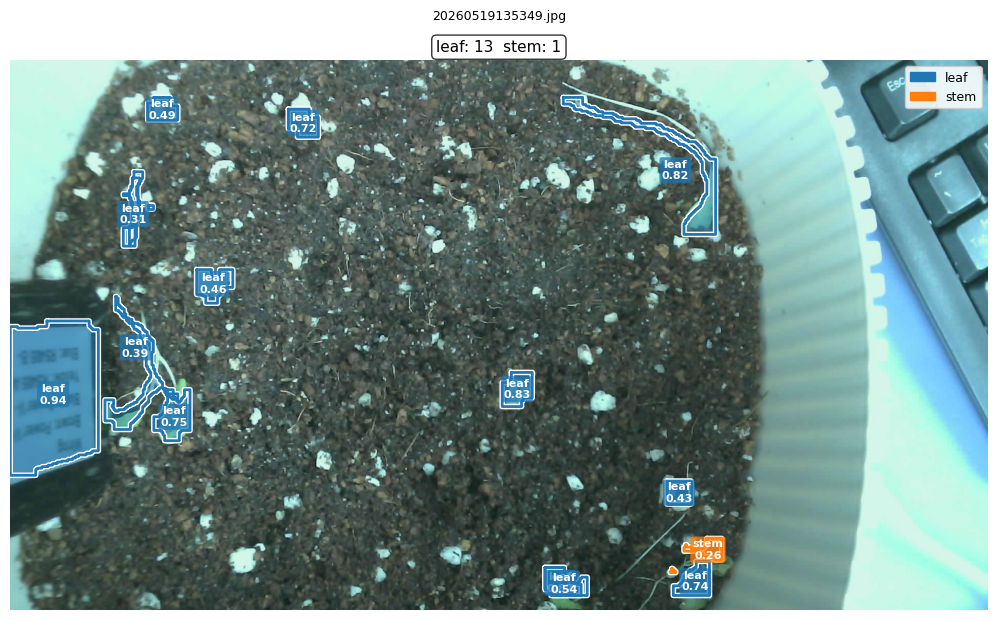

  20260519135349.jpg: leaf=13  stem=1  avg_conf=0.611


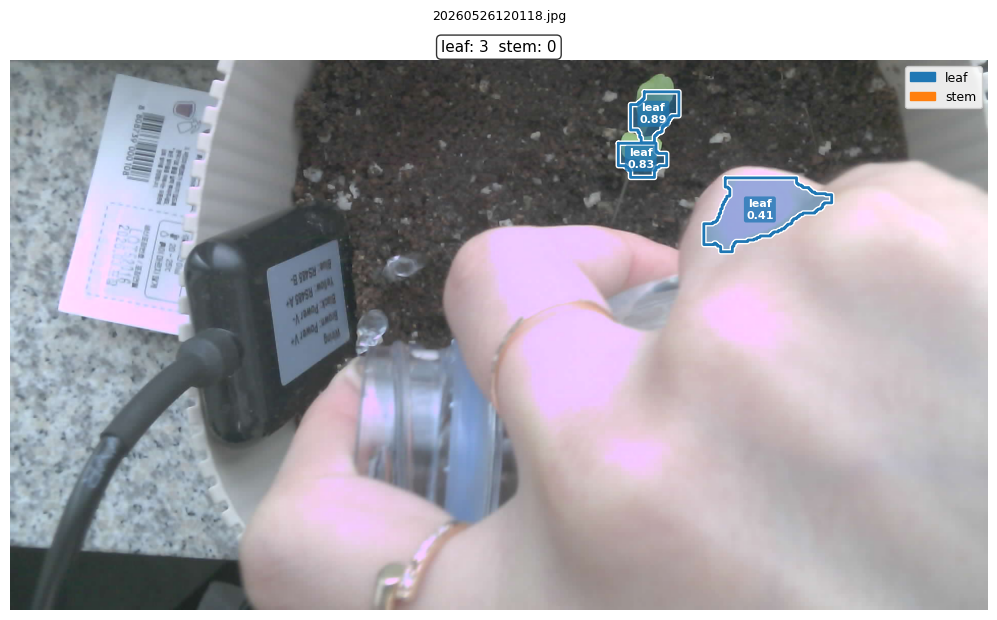

  20260526120118.jpg: leaf=3  stem=0  avg_conf=0.709


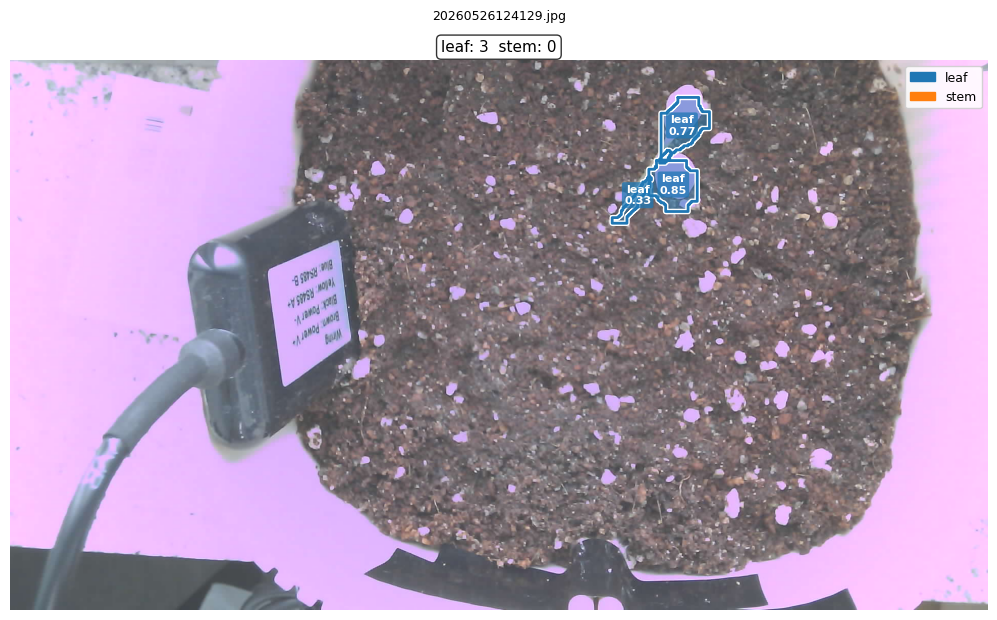

  20260526124129.jpg: leaf=3  stem=0  avg_conf=0.651


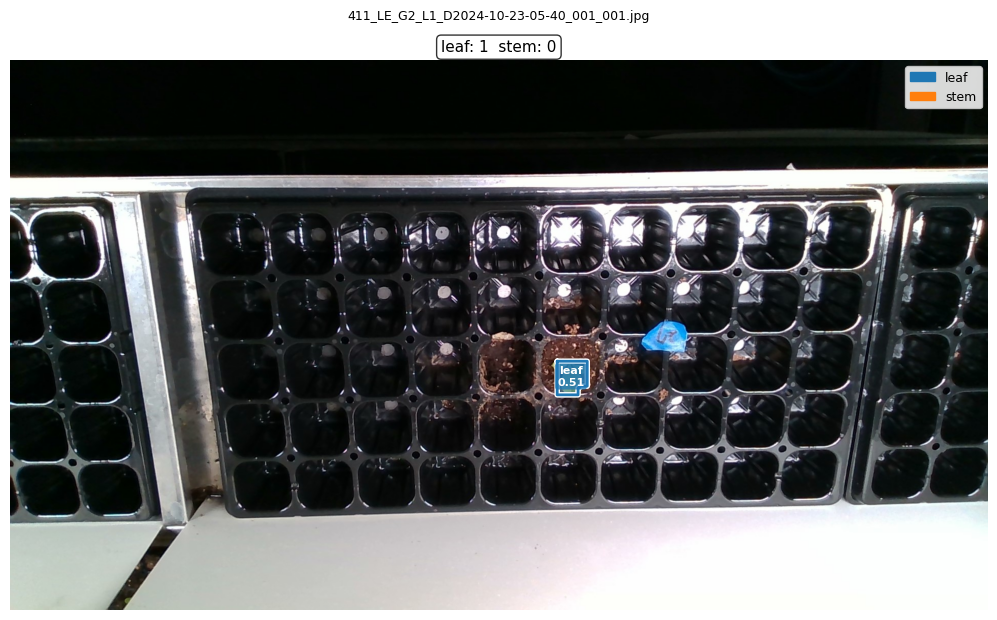

  411_LE_G2_L1_D2024-10-23-05-40_001_001.jpg: leaf=1  stem=0  avg_conf=0.507


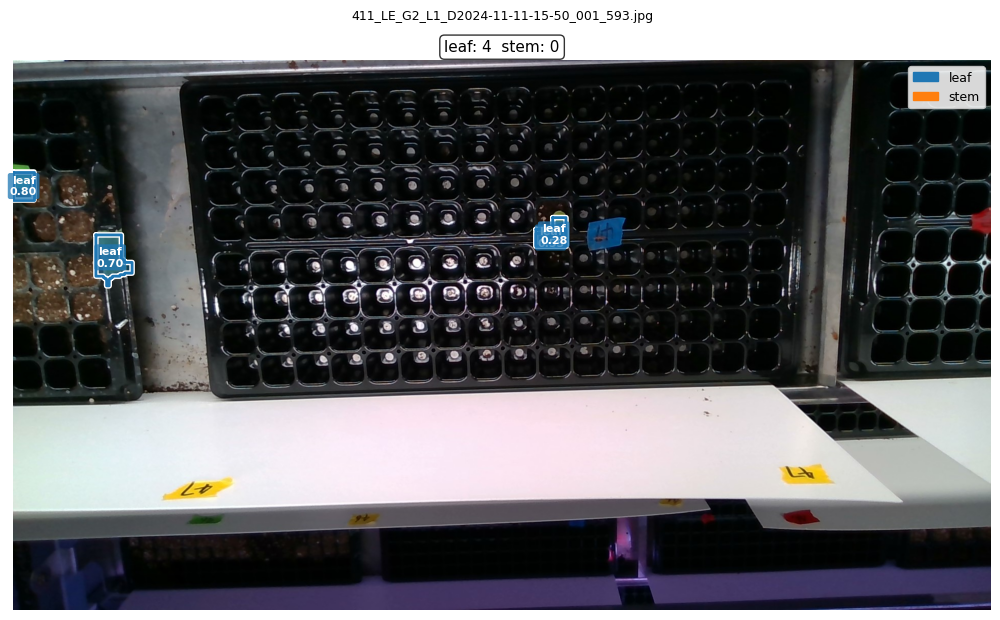

  411_LE_G2_L1_D2024-11-11-15-50_001_593.jpg: leaf=4  stem=0  avg_conf=0.580


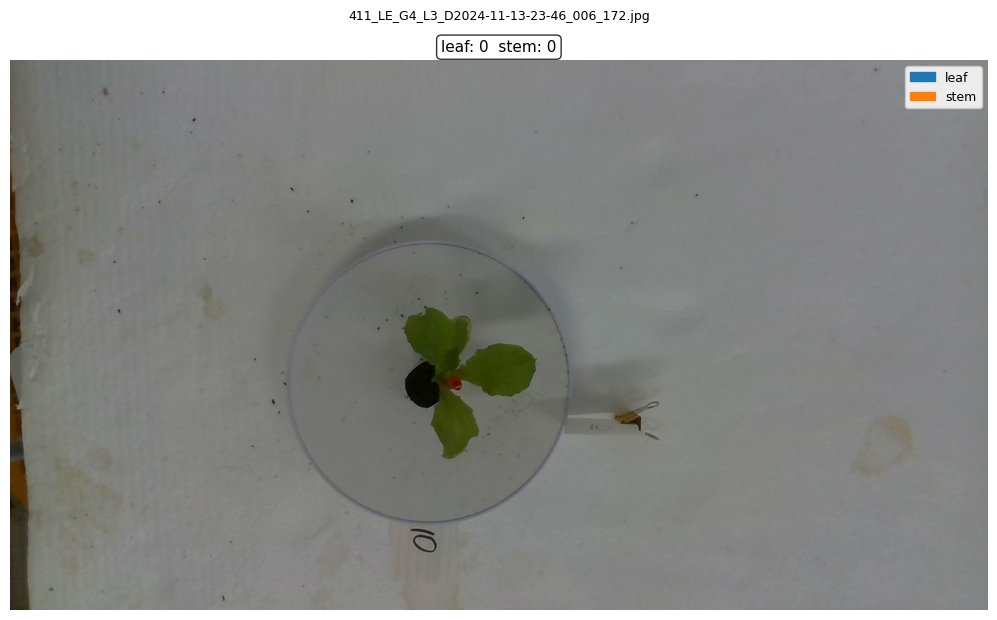

  411_LE_G4_L3_D2024-11-13-23-46_006_172.jpg: leaf=0  stem=0  avg_conf=0.000


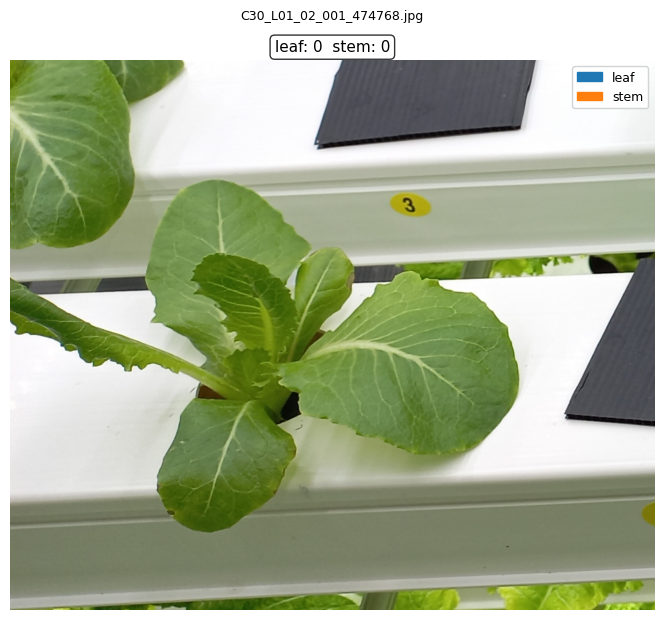

  C30_L01_02_001_474768.jpg: leaf=0  stem=0  avg_conf=0.000


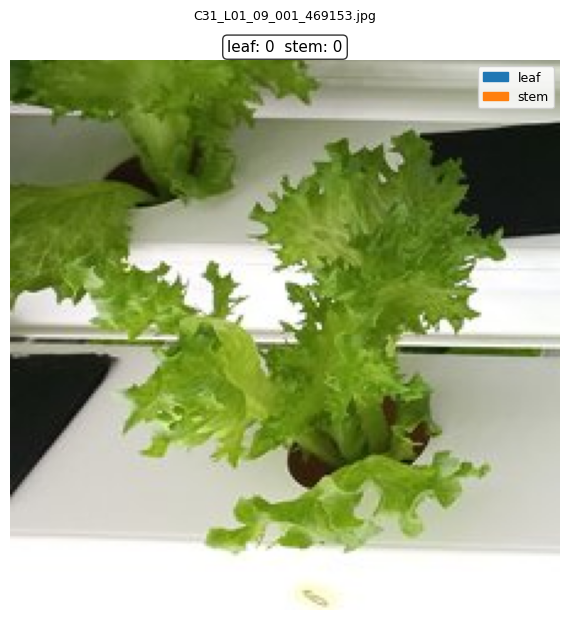

  C31_L01_09_001_469153.jpg: leaf=0  stem=0  avg_conf=0.000


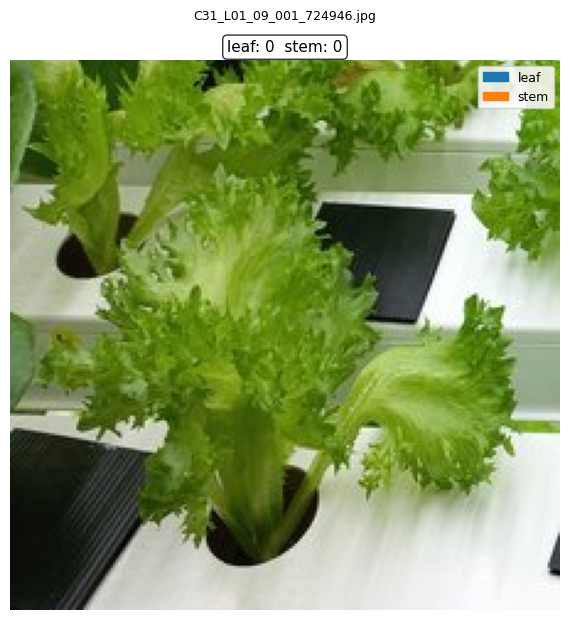

  C31_L01_09_001_724946.jpg: leaf=0  stem=0  avg_conf=0.000


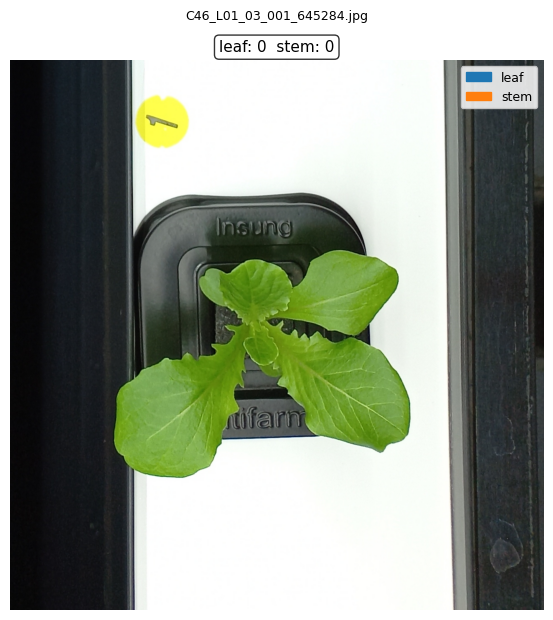

  C46_L01_03_001_645284.jpg: leaf=0  stem=0  avg_conf=0.000


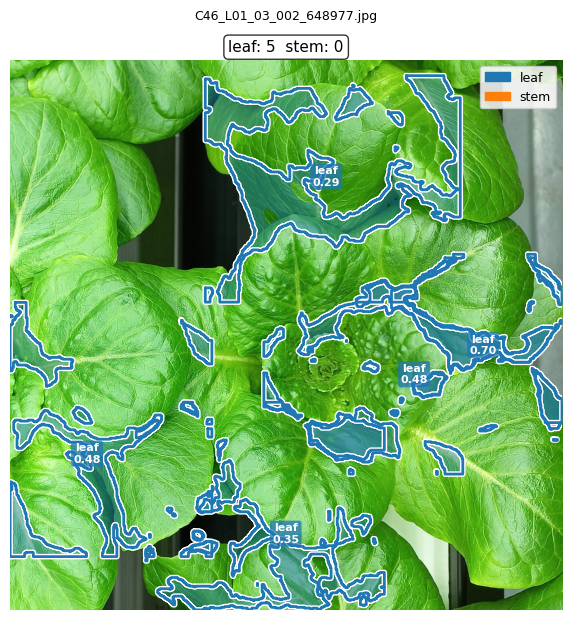

  C46_L01_03_002_648977.jpg: leaf=5  stem=0  avg_conf=0.461


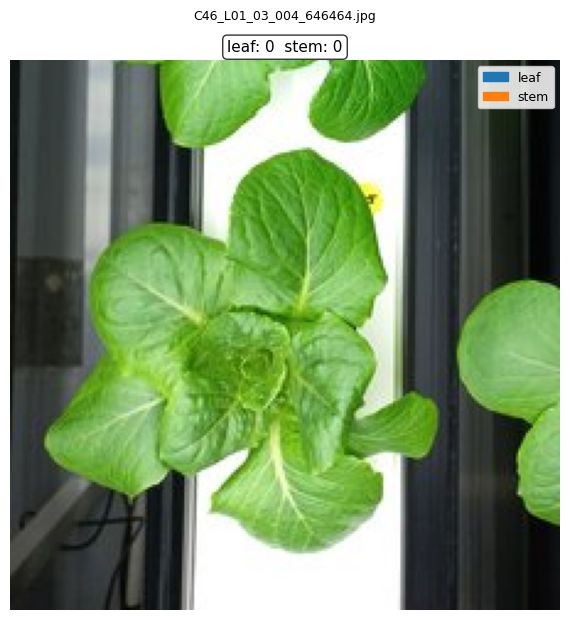

  C46_L01_03_004_646464.jpg: leaf=0  stem=0  avg_conf=0.000


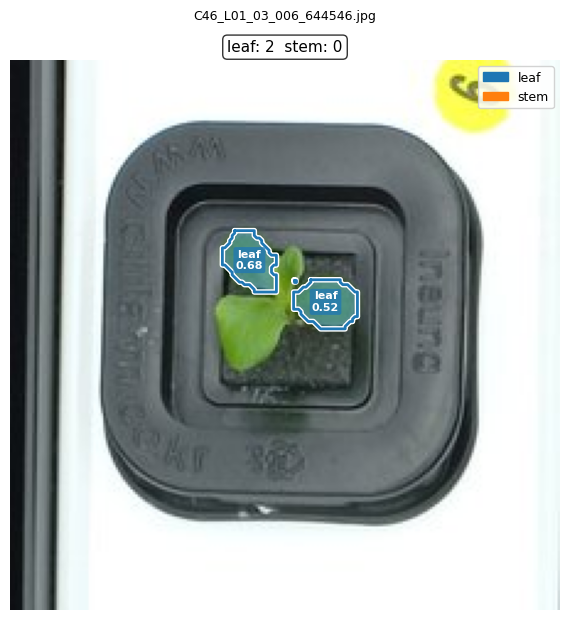

  C46_L01_03_006_644546.jpg: leaf=2  stem=0  avg_conf=0.595


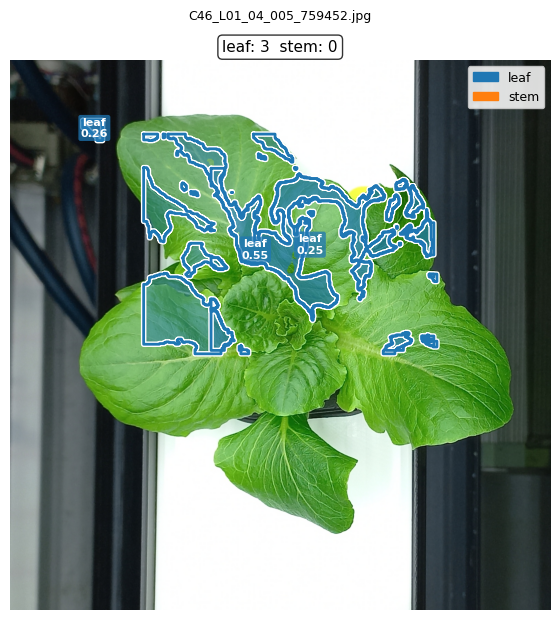

  C46_L01_04_005_759452.jpg: leaf=3  stem=0  avg_conf=0.354


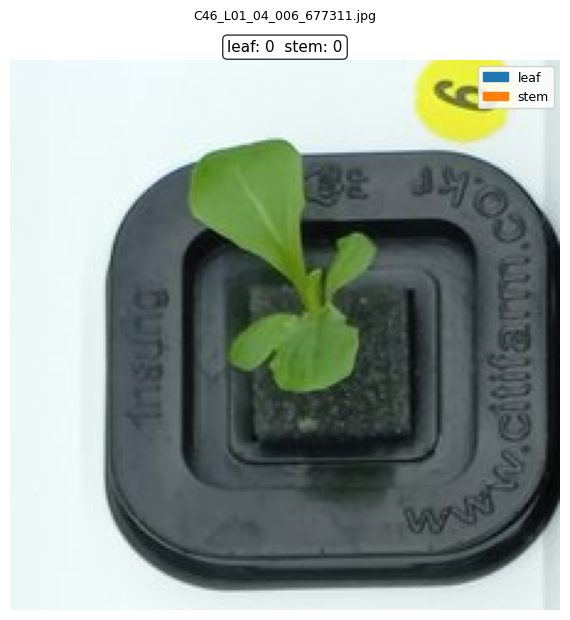

  C46_L01_04_006_677311.jpg: leaf=0  stem=0  avg_conf=0.000


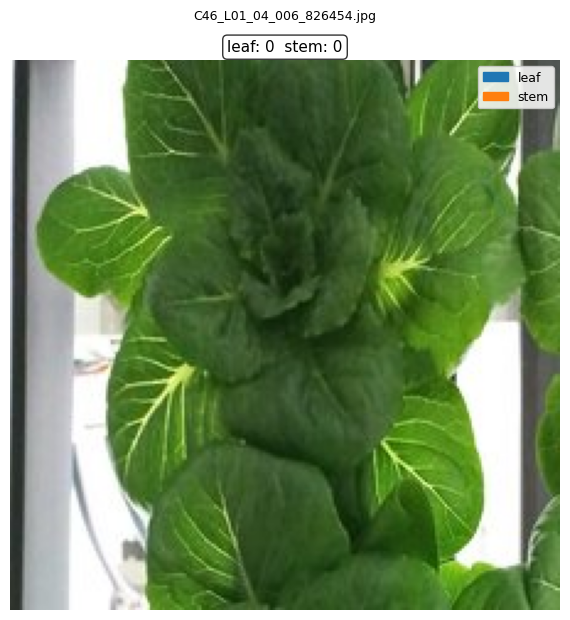

  C46_L01_04_006_826454.jpg: leaf=0  stem=0  avg_conf=0.000


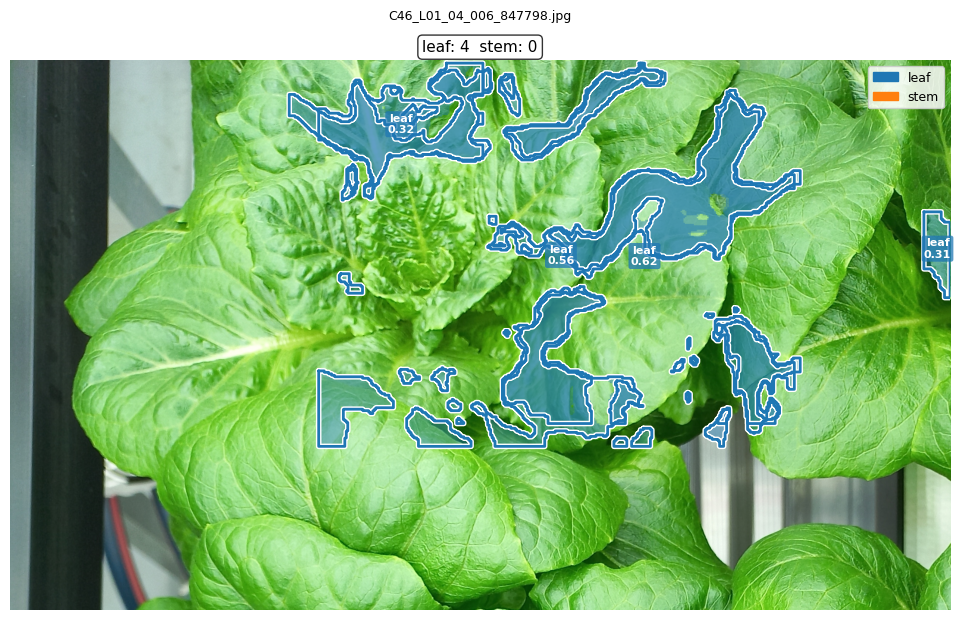

  C46_L01_04_006_847798.jpg: leaf=4  stem=0  avg_conf=0.451


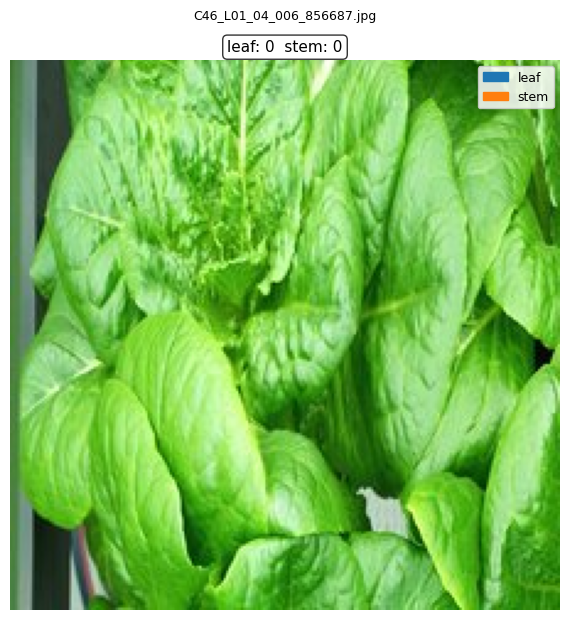

  C46_L01_04_006_856687.jpg: leaf=0  stem=0  avg_conf=0.000


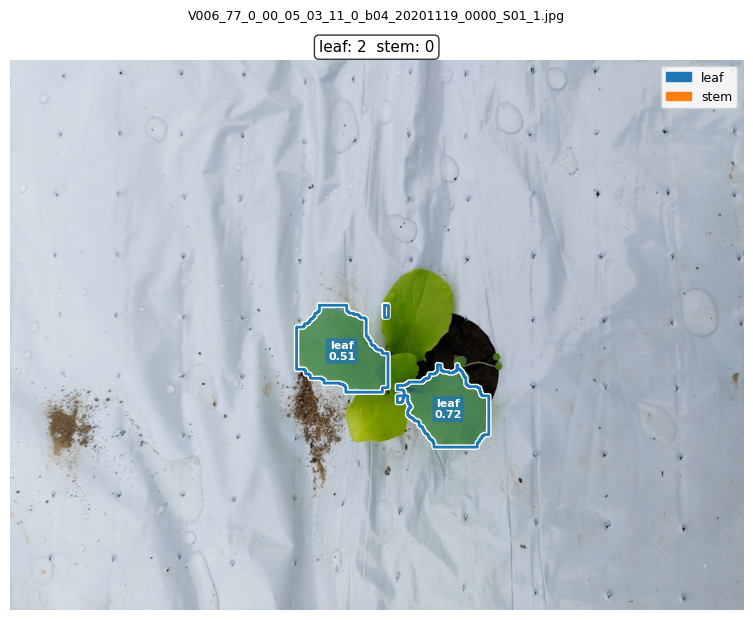

  V006_77_0_00_05_03_11_0_b04_20201119_0000_S01_1.jpg: leaf=2  stem=0  avg_conf=0.617


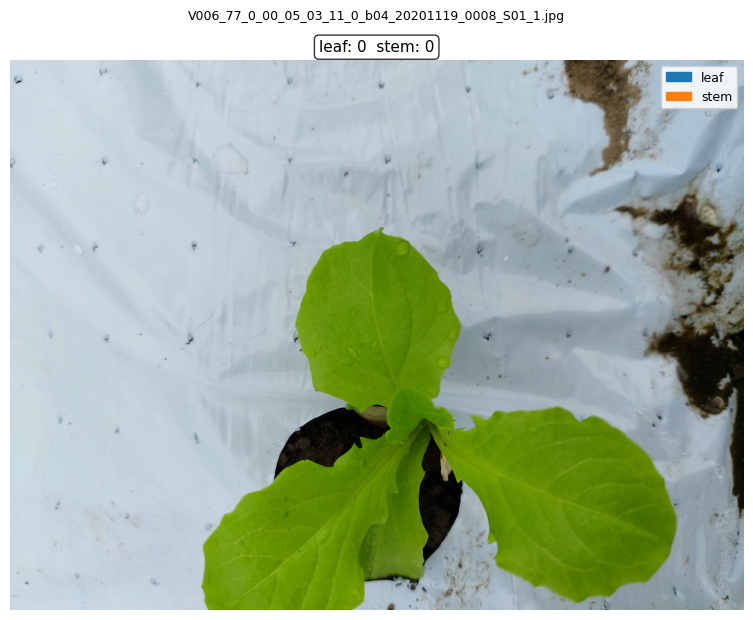

  V006_77_0_00_05_03_11_0_b04_20201119_0008_S01_1.jpg: leaf=0  stem=0  avg_conf=0.000


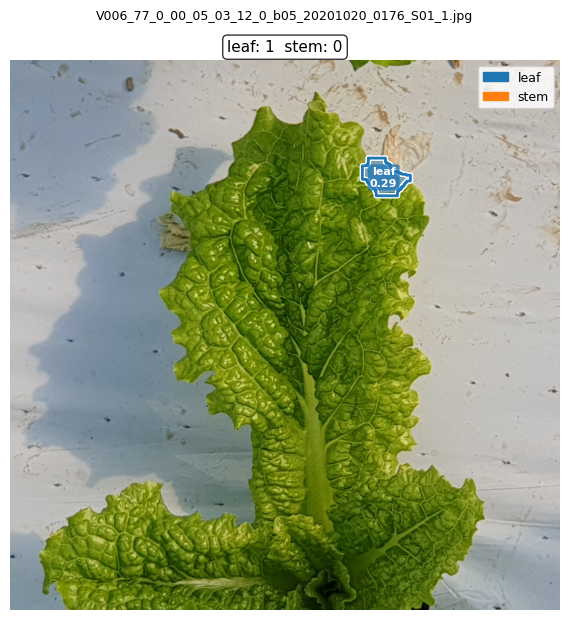

  V006_77_0_00_05_03_12_0_b05_20201020_0176_S01_1.jpg: leaf=1  stem=0  avg_conf=0.286


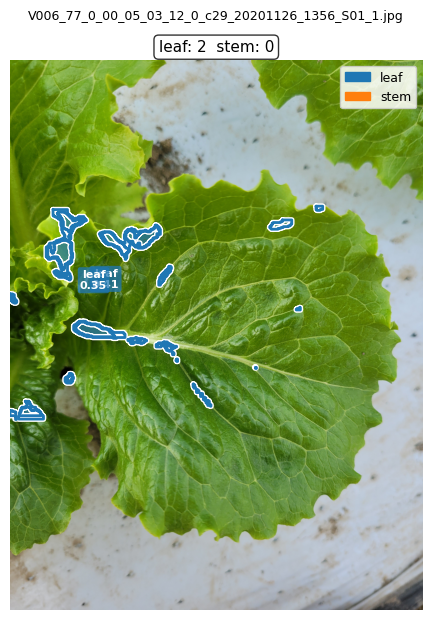

  V006_77_0_00_05_03_12_0_c29_20201126_1356_S01_1.jpg: leaf=2  stem=0  avg_conf=0.377


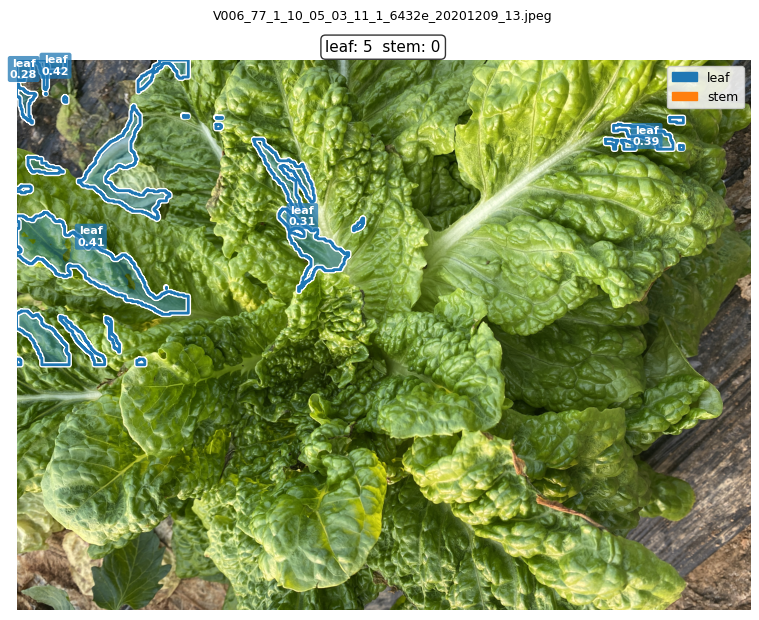

  V006_77_1_10_05_03_11_1_6432e_20201209_13.jpeg: leaf=5  stem=0  avg_conf=0.363


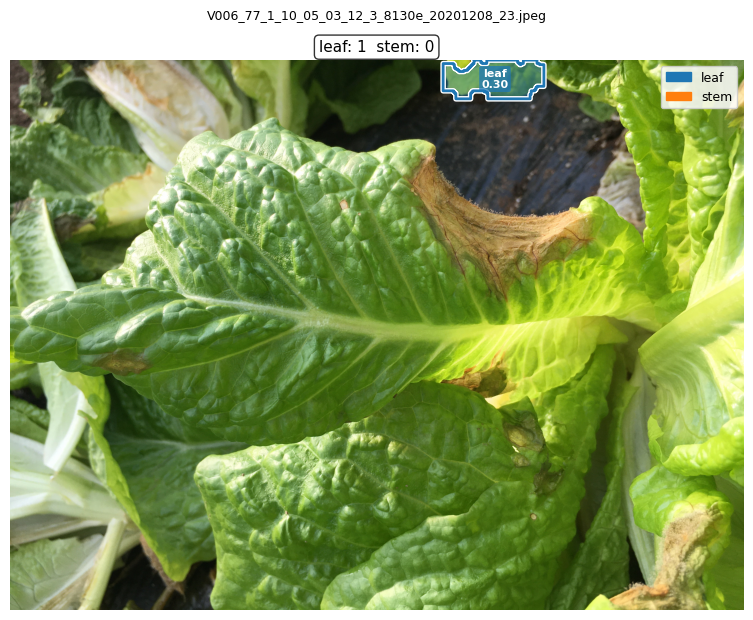

  V006_77_1_10_05_03_12_3_8130e_20201208_23.jpeg: leaf=1  stem=0  avg_conf=0.300

--- 전체 요약 ---
                                           filename  leaf  stem  total_det  avg_conf
                                 20260519135349.jpg    13     1         14     0.611
                                 20260526120118.jpg     3     0          3     0.709
                                 20260526124129.jpg     3     0          3     0.651
         411_LE_G2_L1_D2024-10-23-05-40_001_001.jpg     1     0          1     0.507
         411_LE_G2_L1_D2024-11-11-15-50_001_593.jpg     4     0          4     0.580
         411_LE_G4_L3_D2024-11-13-23-46_006_172.jpg     0     0          0     0.000
                          C30_L01_02_001_474768.jpg     0     0          0     0.000
                          C31_L01_09_001_469153.jpg     0     0          0     0.000
                          C31_L01_09_001_724946.jpg     0     0          0     0.000
                          C46_L01_03_001_645284.jpg   

In [4]:
import pandas as pd

summary = []

for img_path in image_paths:
    image_rgb = np.array(Image.open(img_path).convert('RGB'))
    result    = model.predict(image_rgb, verbose=False)[0]
    counts    = count_instances(result)

    n_det = sum(counts.values())
    confs = result.boxes.conf.cpu().numpy().tolist() if result.boxes is not None and len(result.boxes) else []
    avg_conf = float(np.mean(confs)) if confs else 0.0

    summary.append({
        'filename' : img_path.name,
        'leaf'     : counts['leaf'],
        'stem'     : counts['stem'],
        'total_det': n_det,
        'avg_conf' : round(avg_conf, 3),
    })

    fig = visualize_prediction(image_rgb, result, title=img_path.name)
    plt.show()
    plt.close(fig)
    print(f'  {img_path.name}: leaf={counts["leaf"]}  stem={counts["stem"]}  avg_conf={avg_conf:.3f}')

df_summary = pd.DataFrame(summary)
print('\n--- 전체 요약 ---')
print(df_summary.to_string(index=False))

## 4. 결과 요약

=== Inference 결과 요약 ===
총 이미지     : 24
탐지 있음     : 14
탐지 없음     : 10
평균 leaf 수  : 2.04
평균 stem 수  : 0.04
평균 confidence: 0.490



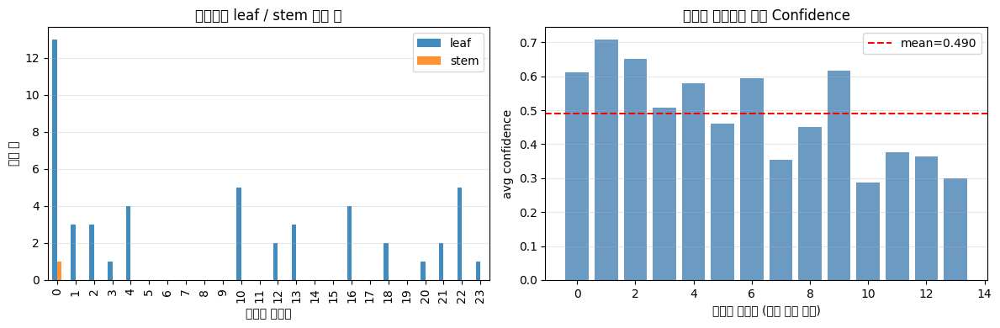

In [5]:
print('=== Inference 결과 요약 ===')
print(f'총 이미지     : {len(df_summary)}')
print(f'탐지 있음     : {(df_summary.total_det > 0).sum()}')
print(f'탐지 없음     : {(df_summary.total_det == 0).sum()}')
print(f'평균 leaf 수  : {df_summary.leaf.mean():.2f}')
print(f'평균 stem 수  : {df_summary.stem.mean():.2f}')
print(f'평균 confidence: {df_summary.avg_conf[df_summary.avg_conf > 0].mean():.3f}')
print()

# 탐지 수 분포 막대 그래프
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

df_summary[['leaf', 'stem']].plot(
    kind='bar', ax=axes[0],
    color=[COLORS[0], COLORS[1]], alpha=0.85
)
axes[0].set_title('이미지별 leaf / stem 탐지 수')
axes[0].set_xlabel('이미지 인덱스')
axes[0].set_ylabel('탐지 수')
axes[0].tick_params(axis='x', labelrotation=90)
axes[0].grid(axis='y', alpha=0.3)

df_nz = df_summary[df_summary.avg_conf > 0]
axes[1].bar(range(len(df_nz)), df_nz.avg_conf.values, color='steelblue', alpha=0.8)
axes[1].axhline(df_nz.avg_conf.mean(), color='red', linestyle='--', label=f'mean={df_nz.avg_conf.mean():.3f}')
axes[1].set_title('탐지된 이미지의 평균 Confidence')
axes[1].set_xlabel('이미지 인덱스 (탐지 있는 것만)')
axes[1].set_ylabel('avg confidence')
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

fig.tight_layout()
plt.show()